In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
# Full path to file 1
file_1 = '../Fetch_data/data/indices/DOW_JONES_2020_2024.csv'  # Replace with the actual path to the single file

# Folder 2 containing the remaining 30 files
folder_2 = '../Fetch_data/data/US-30/'




# List of CSV files in folder 2
folder_2_files = [os.path.join(folder_2, file) for file in os.listdir(folder_2) if file.endswith('.csv')]

# List of CSV files in folder 2
folder_2_files = [os.path.join(folder_2, file) for file in os.listdir(folder_2) if file.endswith('.csv')]

# Combine file_1 with the list of files from folder 2
files = [file_1] + folder_2_files



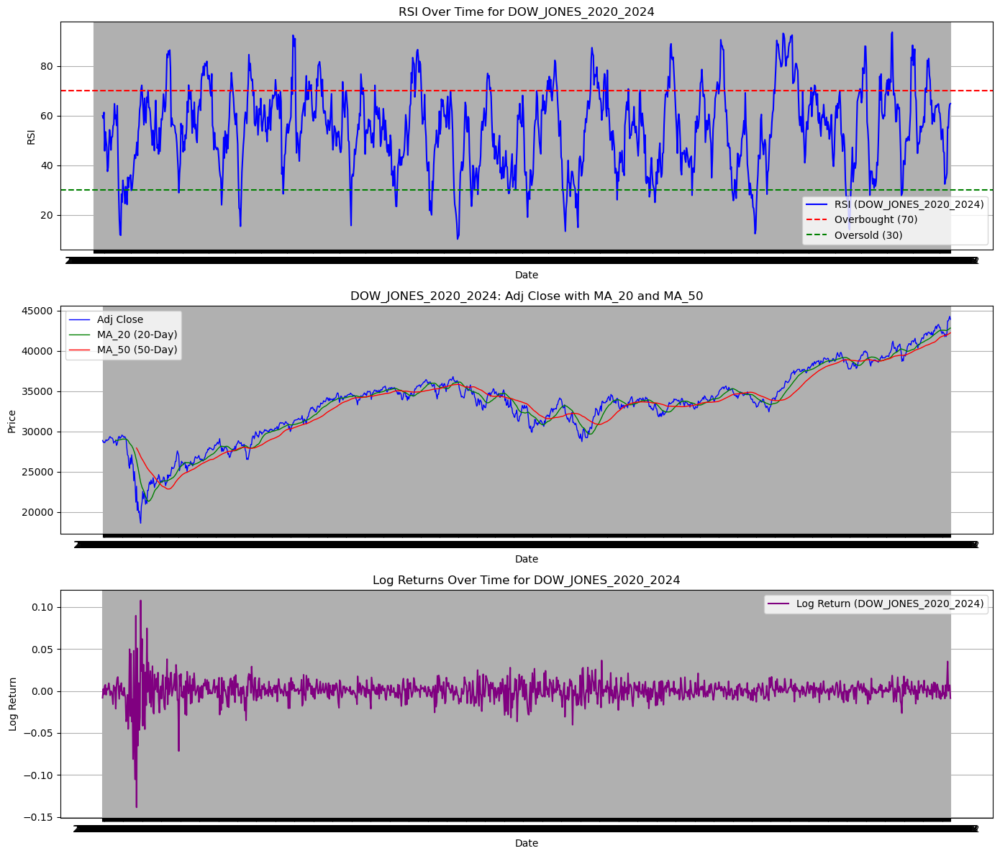

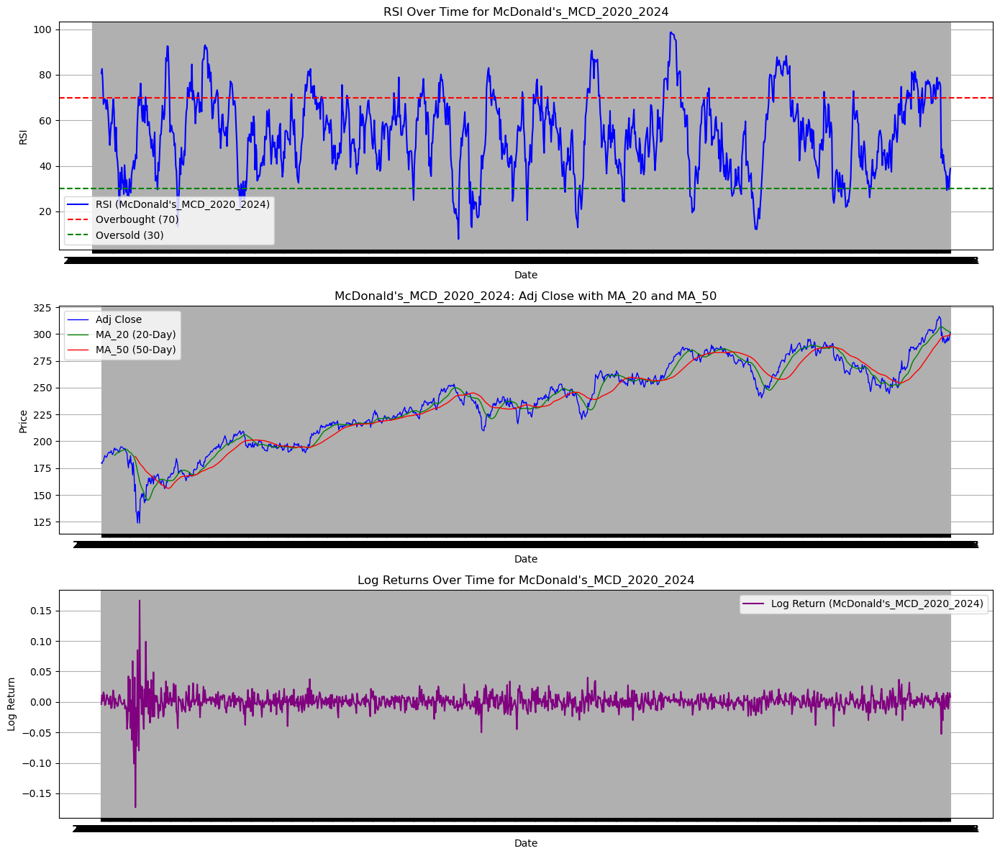

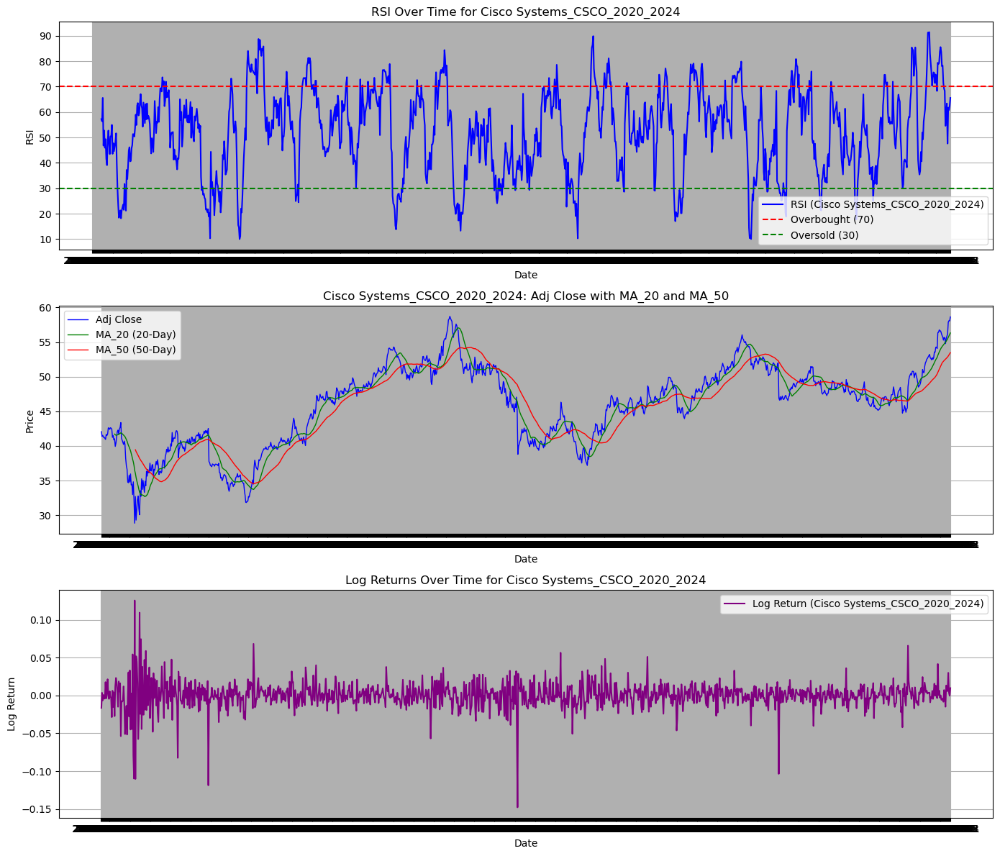

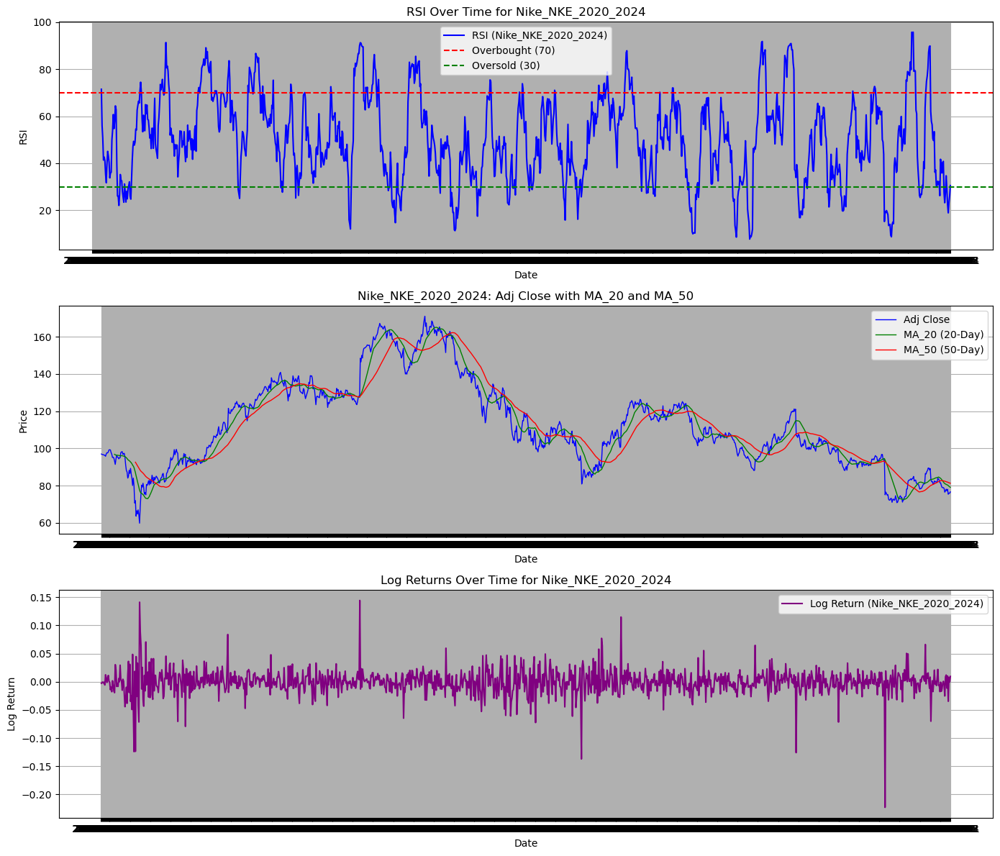

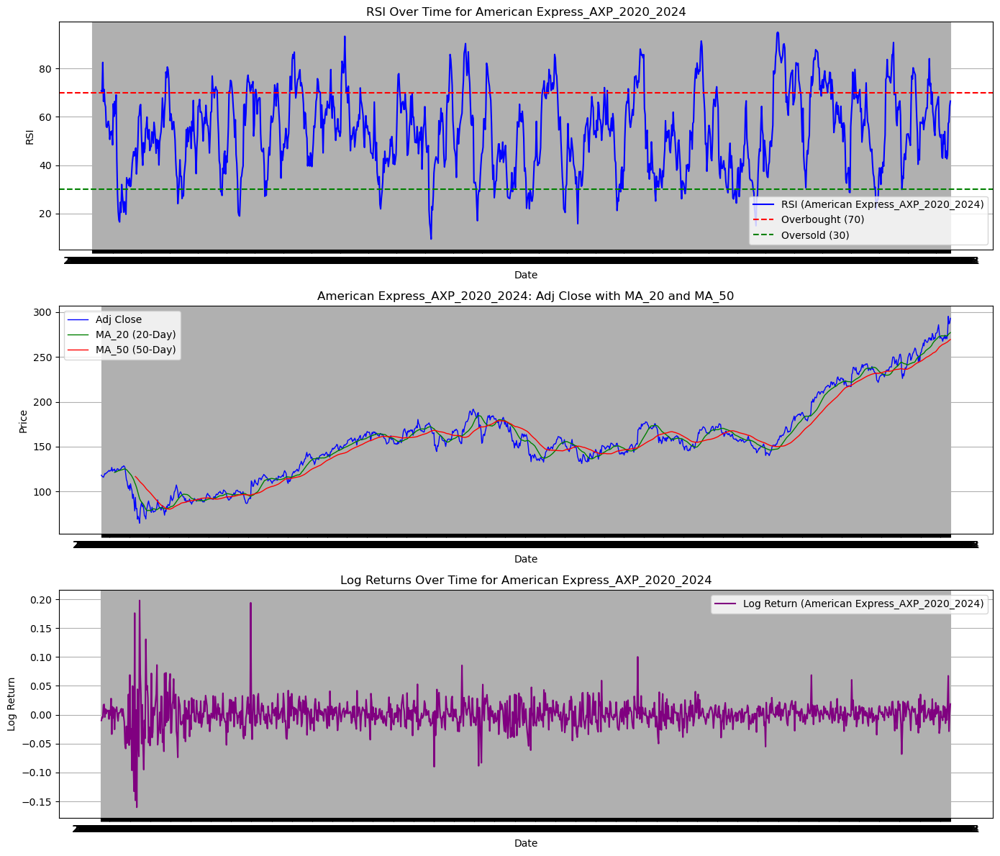

...

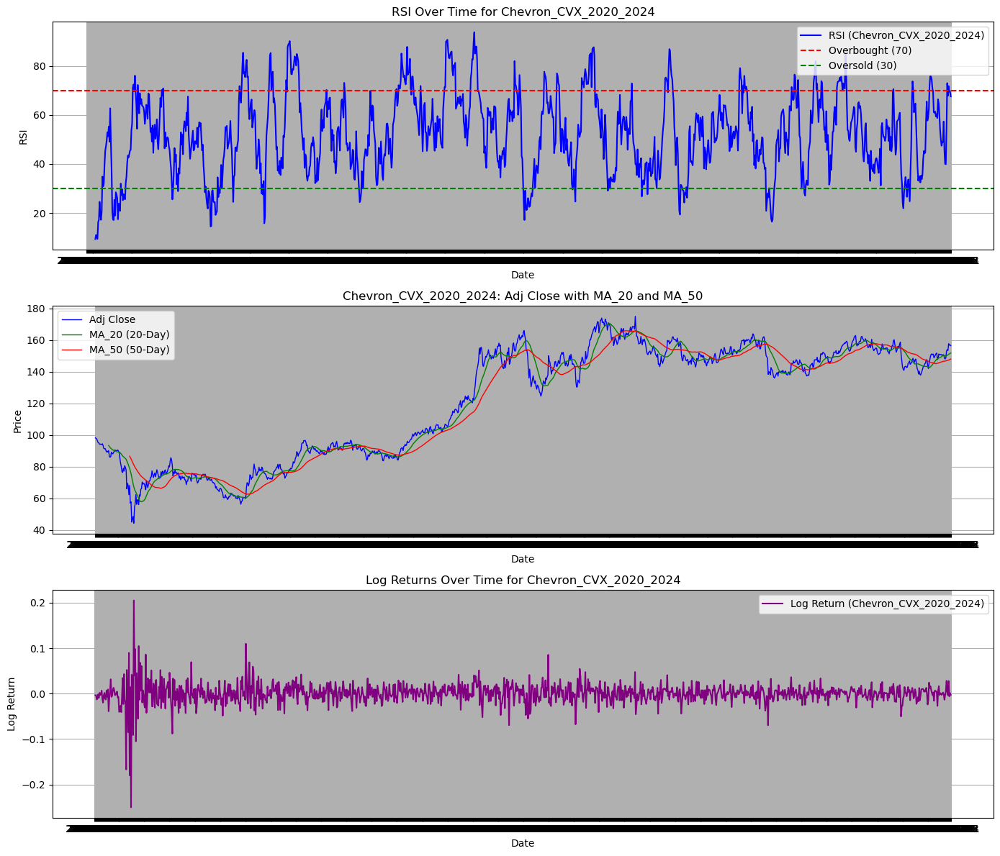

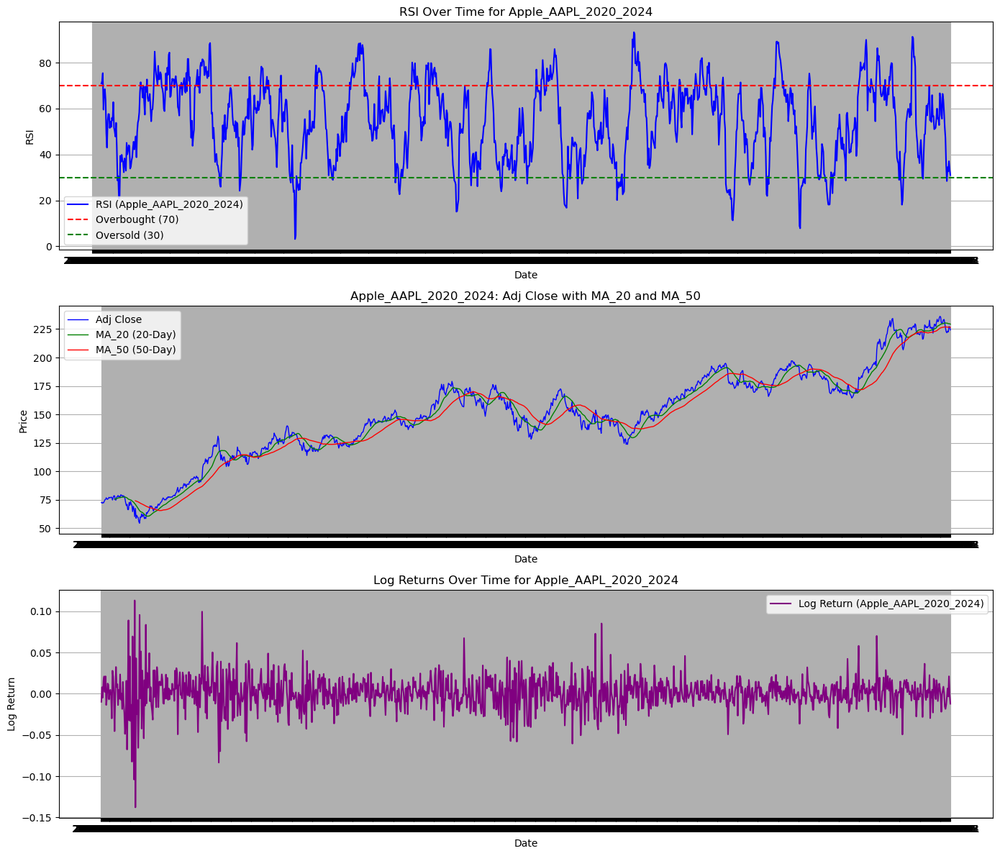

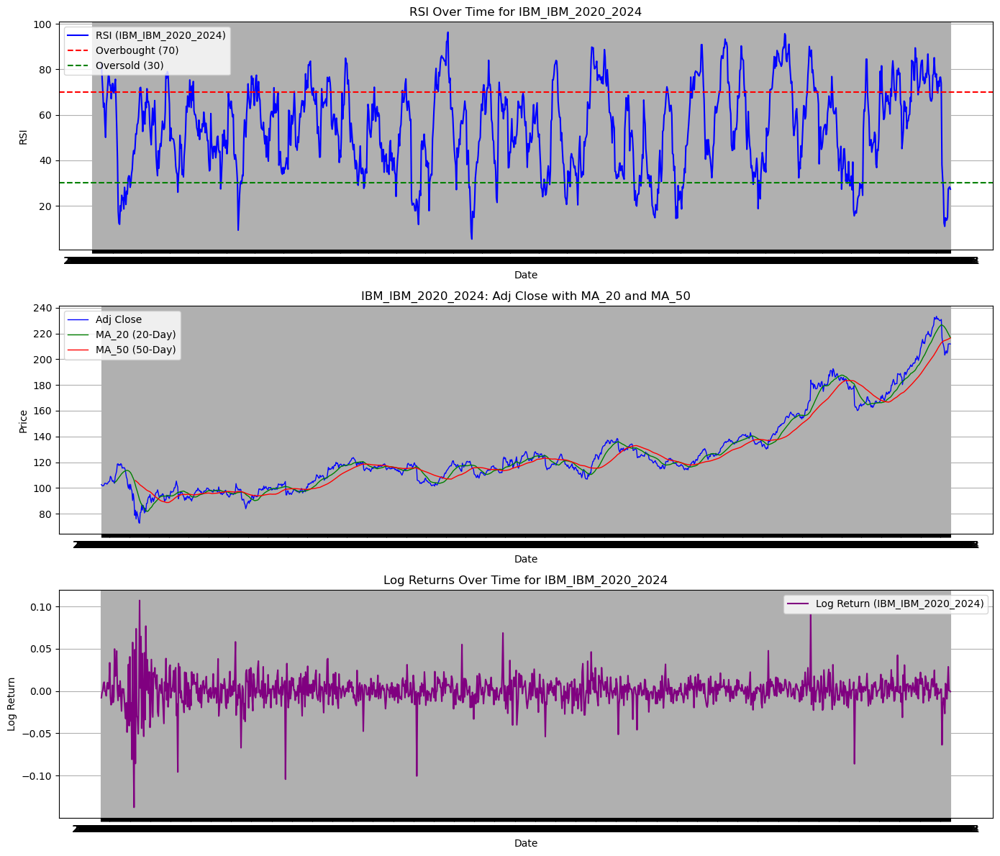

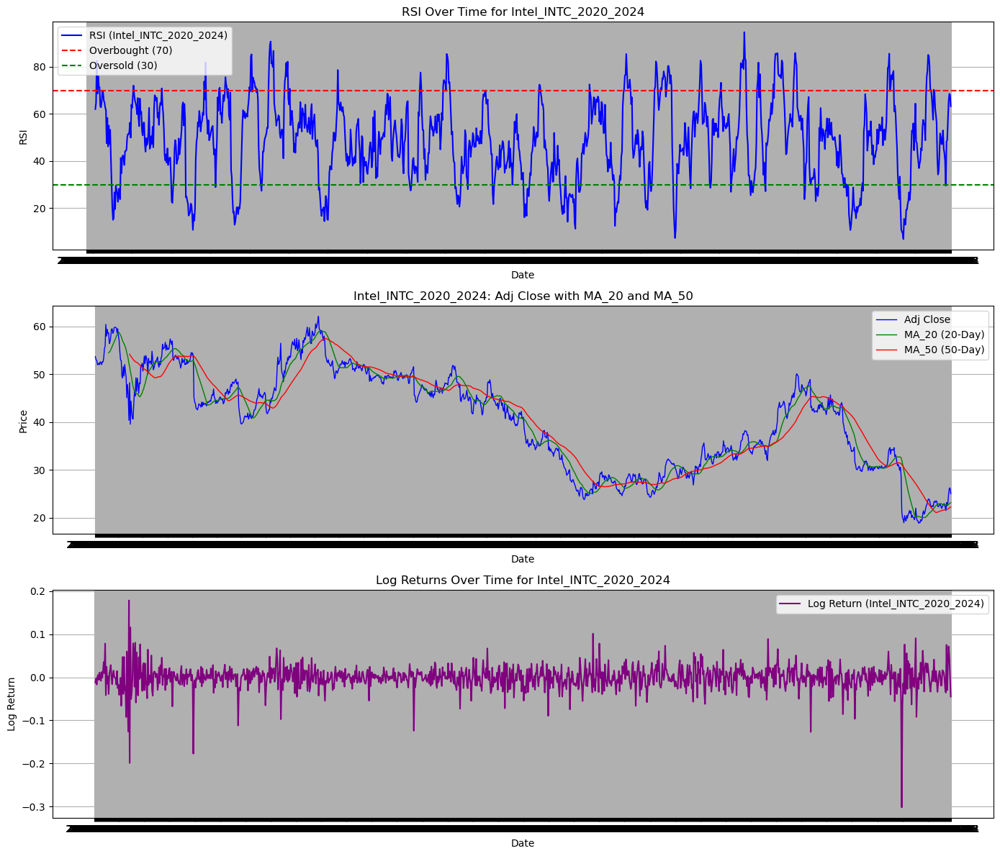

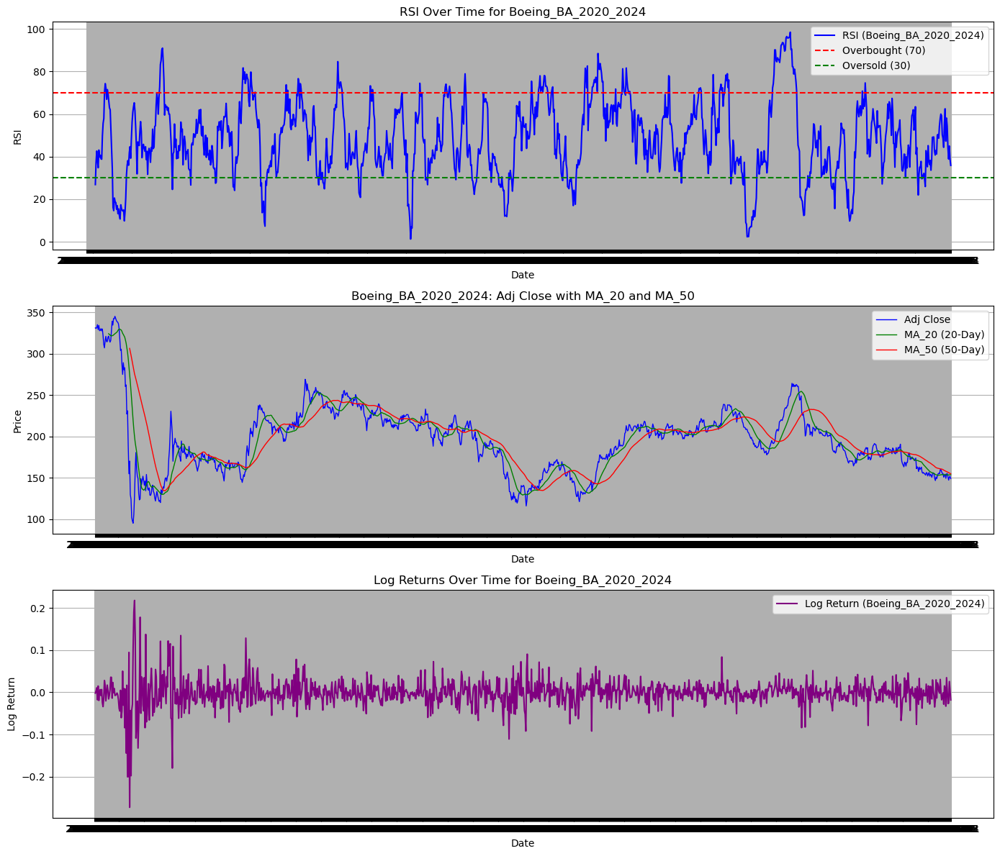

In [3]:
# Function to calculate Log Returns and plot Momentum Indicators for each stock
def plot_momentum_indicators(files):
    for file_path in files:
        stock_name = file_path.split("/")[-1].replace('.csv', '')
        
        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)
        
        # Calculate Log Returns
        df['Log Return'] = np.log(df['Adj Close'] / df['Adj Close'].shift(1))

        # Plotting the Momentum Indicators
        plt.figure(figsize=(14, 12))

        # Subplot 1: Plot RSI
        plt.subplot(3, 1, 1)
        plt.plot(df['Date'], df['RSI'], label=f'RSI ({stock_name})', color='blue')
        plt.axhline(y=70, color='red', linestyle='--', label='Overbought (70)')
        plt.axhline(y=30, color='green', linestyle='--', label='Oversold (30)')
        plt.title(f'RSI Over Time for {stock_name}')
        plt.xlabel('Date')
        plt.ylabel('RSI')
        plt.legend(loc='best')
        plt.grid(True)

        # Subplot 2: Plot MA_20, MA_50, and Adj Close
        plt.subplot(3, 1, 2)
        plt.plot(df['Date'], df['Adj Close'], label='Adj Close', color='blue', linewidth=1)
        plt.plot(df['Date'], df['MA_20'], label='MA_20 (20-Day)', color='green', linewidth=1)
        plt.plot(df['Date'], df['MA_50'], label='MA_50 (50-Day)', color='red', linewidth=1)
        plt.title(f'{stock_name}: Adj Close with MA_20 and MA_50')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend(loc='best')
        plt.grid(True)

        # Subplot 3: Plot Log Returns
        plt.subplot(3, 1, 3)
        plt.plot(df['Date'], df['Log Return'], label=f'Log Return ({stock_name})', color='purple')
        plt.title(f'Log Returns Over Time for {stock_name}')
        plt.xlabel('Date')
        plt.ylabel('Log Return')
        plt.legend(loc='best')
        plt.grid(True)

        # Adjust layout and show the plots
        plt.tight_layout()
        plt.show()

# Plot momentum indicators for all stocks
plot_momentum_indicators(files)